In [45]:
import torch
torch.cuda.empty_cache()

In [4]:
import numpy as np
import os
import matplotlib.pyplot as plt
import nibabel as nib
import skimage.transform as resize
import seaborn as sns
import torch.nn as nn
import torch
import skimage
from torchvision import transforms

In [5]:
import skimage

In [6]:
from torch.utils.data import DataLoader

In [49]:
class Args:
    def __init__(self):
        self.batch_size = 8
        self.log_interval = 10
        self.learning_rate = 3e-5
        self.epochs = 20
        self.patience = 10 # For early stopping
args = Args()

In [50]:
cuda = torch.cuda.is_available()
if cuda:
    print('Cuda Available')
else:
    print('CPU only')

Cuda Available


#### Creating train, val, test data

In [41]:
X = np.load("/home/anshul/Datasets_Analyze/Source_Data/Train.npy")
y1 = np.load("/home/anshul/Datasets_Analyze/Source_Data/Organs/spleen.npy")
y2 = np.load("/home/anshul/Datasets_Analyze/Source_Data/Organs/liver.npy")
y3 = np.load("/home/anshul/Datasets_Analyze/Source_Data/Organs/stomach.npy")
y4 = np.load("/home/anshul/Datasets_Analyze/Source_Data/Organs/pancreas.npy")
y5 = np.load("/home/anshul/Datasets_Analyze/Source_Data/Organs/urinary_bladder.npy")

In [42]:
image_data = []
for i in range(len(X)):
    enhanced_img = np.zeros_like(X[i])
    for slice in range(X[i].shape[2]):
        slice_data = X[i][:,:,slice]

        # Perform Histogram Equalization
        hist, bins = np.histogram(slice_data.flatten(), bins=256, range=(0,255))
        cdf = hist.cumsum()
        cdf_normalized = cdf*hist.max()/cdf.max()
        equalized = np.interp(slice_data.flatten(), bins[:-1], cdf_normalized).reshape(slice_data.shape)
        enhanced_img[:,:,slice] = equalized
    image_data.append(enhanced_img)
XX = np.array(image_data)

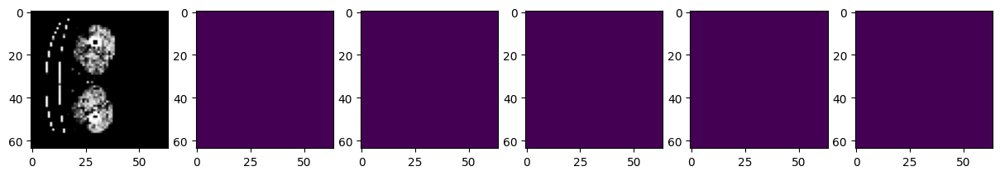

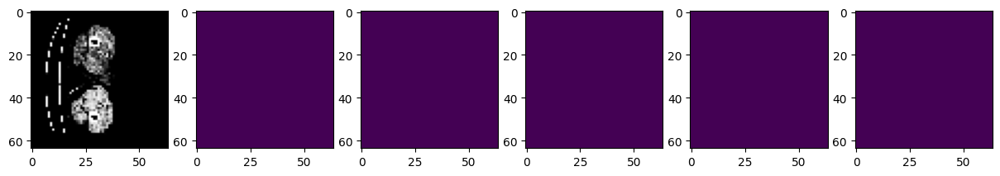

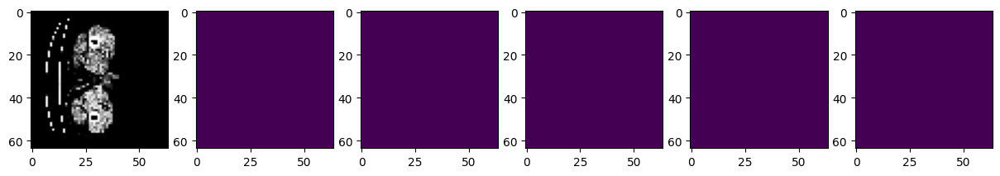

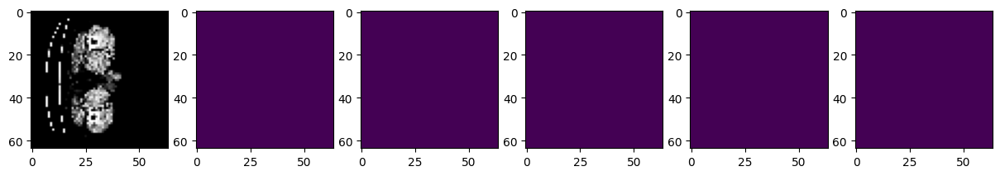

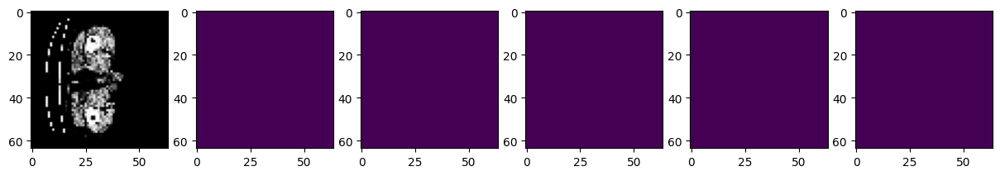

...

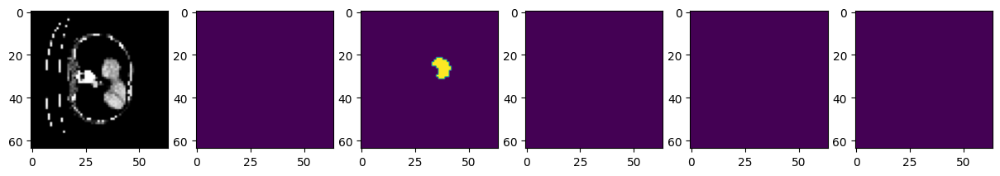

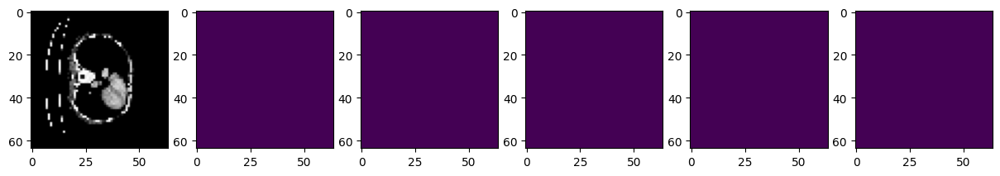

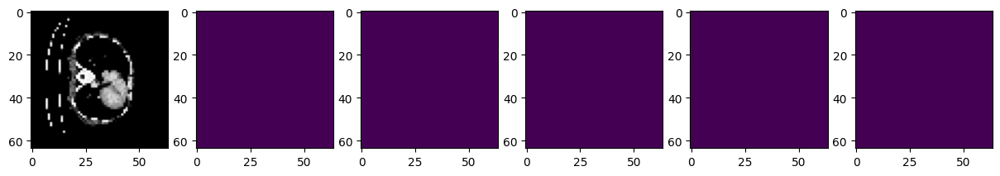

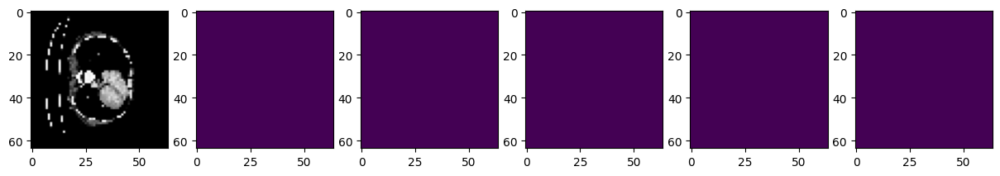

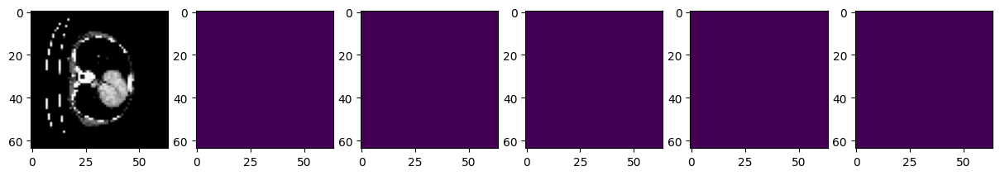

In [28]:
for j in range(64):
    plt.figure(figsize=(15,15))
    plt.subplot(1, 6, 1)
    plt.imshow(XX[15][:,:,j], cmap = "gray")
    plt.subplot(1, 6, 2)
    plt.imshow(y1[15][:,:,j])
    plt.subplot(1, 6, 3)
    plt.imshow(y2[15][:,:,j])
    plt.subplot(1, 6, 4)
    plt.imshow(y3[15][:,:,j])
    plt.subplot(1, 6, 5)
    plt.imshow(y4[15][:,:,j])
    plt.subplot(1, 6, 6)
    plt.imshow(y5[15][:,:,j])
    plt.show()

In [43]:
print(X.shape, y1.shape, y2.shape, y3.shape, y4.shape, y5.shape)

(360, 64, 64, 64) (360, 64, 64, 64) (360, 64, 64, 64) (360, 64, 64, 64) (360, 64, 64, 64) (360, 64, 64, 64)


In [44]:
from sklearn.utils import shuffle
X, XX, y1, y2, y3, y4, y5 = shuffle(X, XX, y1, y2, y3, y4, y5, random_state=0)  # Same seed everytime
train_prop = 0.7  # Proportion of data for training
val_prop = 0.2    # Proportion of data for validation
test_prop = 0.1   # Proportion of data for testing

num_examples = len(XX)
train_size = int(train_prop * num_examples)
val_size = int(val_prop * num_examples)

# Split the data
X_train = X[:train_size]
XX_train = XX[:train_size]
y1_train = y1[:train_size]
y2_train = y2[:train_size]
y3_train = y3[:train_size]
y4_train = y4[:train_size]
y5_train = y5[:train_size]
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/X_train.npy", X_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/XX_train.npy", XX_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Spleen/y_train.npy", y1_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Liver/y_train.npy", y2_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Stomach/y_train.npy", y3_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Pancreas/y_train.npy", y4_train)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Urinary_Bladder/y_train.npy", y5_train)

X_val = X[train_size:train_size + val_size]
XX_val = XX[train_size:train_size + val_size]
y1_val = y1[train_size:train_size + val_size]
y2_val = y2[train_size:train_size + val_size]
y3_val = y3[train_size:train_size + val_size]
y4_val = y4[train_size:train_size + val_size]
y5_val = y5[train_size:train_size + val_size]

np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/X_val.npy", X_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/XX_val.npy", XX_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Spleen/y_val.npy", y1_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Liver/y_val.npy", y2_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Stomach/y_val.npy", y3_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Pancreas/y_val.npy", y4_val)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Urinary_Bladder/y_val.npy", y5_val)

X_test = X[train_size + val_size:]
XX_test = XX[train_size + val_size:]
y1_test = y1[train_size + val_size:]
y2_test = y2[train_size + val_size:]
y3_test = y3[train_size + val_size:]
y4_test = y4[train_size + val_size:]
y5_test = y5[train_size + val_size:]

np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/X_test.npy", X_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/XX_test.npy", XX_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Spleen/y_test.npy", y1_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Liver/y_test.npy", y2_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Stomach/y_test.npy", y3_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Pancreas/y_test.npy", y4_test)
np.save("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Urinary_Bladder/y_test.npy", y5_test)

print(X_train.shape, y1_train.shape)
print(X_val.shape, y1_val.shape)
print(X_test.shape, y1_test.shape)

(251, 64, 64, 64) (251, 64, 64, 64)
(72, 64, 64, 64) (72, 64, 64, 64)
(37, 64, 64, 64) (37, 64, 64, 64)


In [ ]:
for j in range(64):
    plt.imshow(X[2][:,:,j])
    plt.show()
    plt.imshow(y[2][:,:,j])
    plt.show()

#### Back to training procedure

In [7]:
X_train = np.load("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/X_train.npy")
y_train = np.load("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Liver/y_train.npy")

X_val = np.load("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/X_val.npy")
y_val = np.load("/home/anshul/Datasets_Analyze/Source_Data/Dataset_Split_Binary/Liver/y_val.npy")

In [8]:
X_train = np.reshape(X_train, (-1, 1, 64, 64, 64))
print(X_train.shape)
X_train = X_train / np.percentile(X_train, 99.9)
X_train[X_train>1] = 1
X_train = X_train - np.mean(X_train)

X_val = np.reshape(X_val, (-1, 1, 64, 64, 64))
print(X_val.shape)
X_val = X_val / np.percentile(X_val, 99.9)
X_val[X_val>1] = 1
X_val = X_val - np.mean(X_val)

(251, 1, 64, 64, 64)
(72, 1, 64, 64, 64)


In [9]:
y_store = np.zeros((len(y_train), 2, 64, 64, 64))
y_store[:,0,:,:,:][y_train==0] = 1
y_store[:,1,:,:,:][y_train==6] = 1
y_train = y_store
print(y_train.shape)
y_store = np.zeros((len(y_val), 2, 64, 64, 64))
y_store[:,0,:,:,:][y_val==0] = 1
y_store[:,1,:,:,:][y_val==6] = 1
y_val = y_store
print(y_val.shape)

(251, 2, 64, 64, 64)
(72, 2, 64, 64, 64)


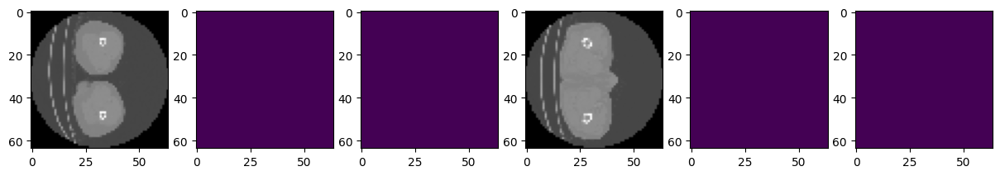

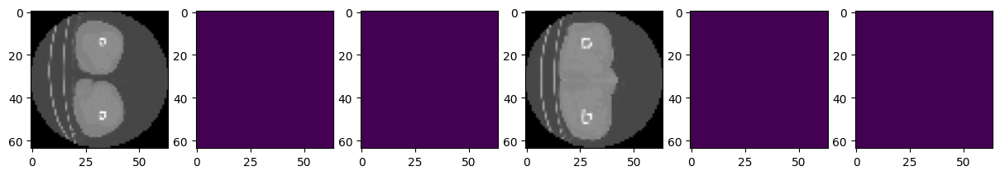

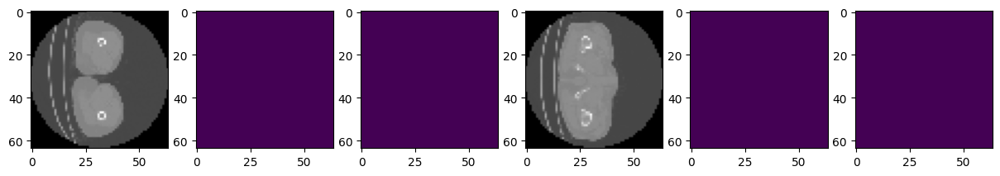

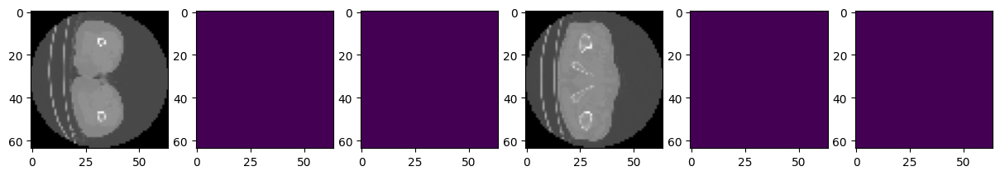

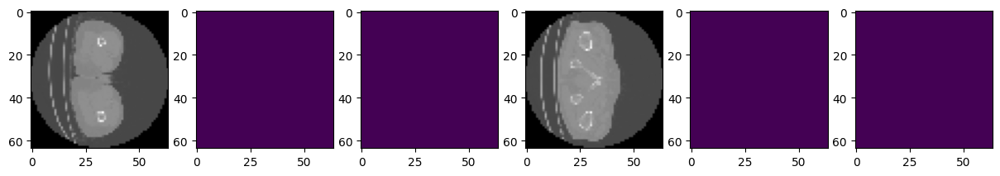

...

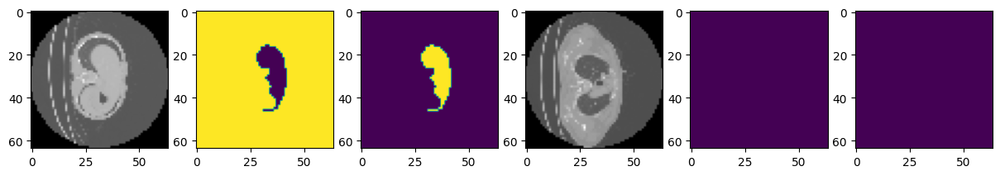

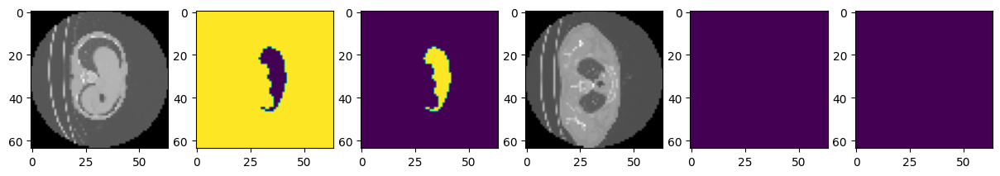

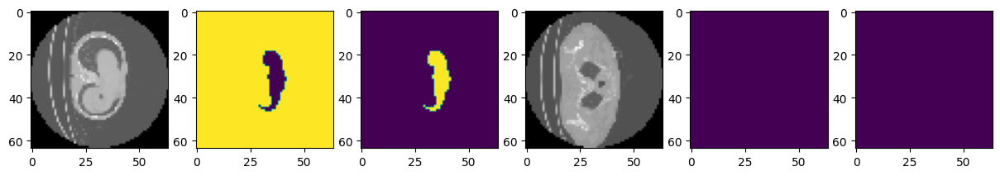

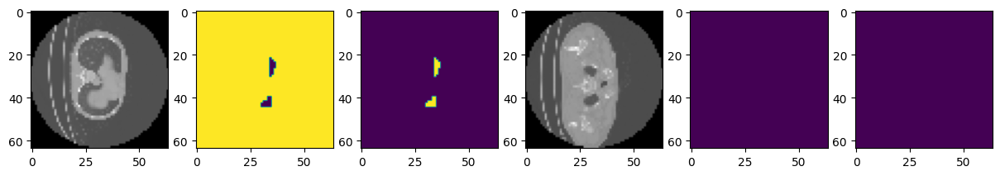

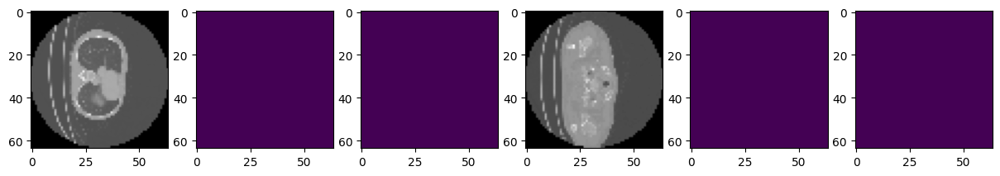

In [10]:
subj = 40
for slices in range(64):
    plt.figure(figsize=(15,15))
    plt.subplot(1, 6, 1)
    plt.imshow(X_train[subj,0,:,:,slices], cmap = "gray")
    plt.subplot(1, 6, 2)
    plt.imshow(y_train[subj,0,:,:,slices])
    plt.subplot(1, 6, 3)
    plt.imshow(y_train[subj,1,:,:,slices])
    plt.subplot(1, 6, 4)
    plt.imshow(X_val[subj,0,:,:,slices], cmap = "gray")
    plt.subplot(1, 6, 5)
    plt.imshow(y_val[subj,0,:,:,slices])
    plt.subplot(1, 6, 6)
    plt.imshow(y_val[subj,1,:,:,slices])
    plt.show()

In [11]:
from scipy.ndimage import affine_transform

In [12]:
# Defining a few custom data augmentation transforms
import torchvision.transforms.functional as F
from torchvision import transforms
import random
from scipy.ndimage import shift
from scipy.ndimage import gaussian_filter, affine_transform
from scipy.ndimage import rotate, zoom

# The dictionary of images: {'input': input_data, 'gt': label}
# ToTensor() is the final transform to be applied in the composed transforms
# Hence, we load the numpy array, apply the transform and finally convert them to N x C x X_dim x Y_dim x Z_dim
# And convert them to tensors.
class ToTensor(object):
    """Convert a PIL image or numpy array to a PyTorch tensor."""

    def __init__(self, labeled=True):
        self.labeled = labeled

    def __call__(self, sample):
        rdict = {}
        input_data = sample[0]
        ret_input = torch.from_numpy(input_data.copy()).float()

        rdict['input'] = ret_input

        if self.labeled:
            gt_data = sample[1]
            if gt_data is not None:
                ret_gt = torch.from_numpy(gt_data.copy()).float()

                rdict['gt'] = ret_gt

        return rdict['input'], rdict['gt']

class RandomRotation3D(object):
    """Make a rotation of the volume's values.
    :param degrees: Maximum rotation's degrees.
    """
    def __init__(self, axis=0, labeled=True, segment=True):
        self.labeled = labeled
        self.segment = segment
        self.order = 0 if self.segment == True else 5

    def __call__(self, sample):
        rdict = {}
        input_data = sample[0].numpy()
        if len(sample[0].shape) != 4: # C x X_dim x Y_dim x Z_dim
            raise ValueError("Input of RandomRotation3D should be a 4 dimensionnal tensor.")

        alpha, beta, gamma = np.random.random_sample(3)*np.pi/12
        Rx = np.array([[1, 0, 0],
                       [0, np.cos(alpha), -np.sin(alpha)],
                       [0, np.sin(alpha), np.cos(alpha)]])
        Ry = np.array([[np.cos(alpha),0, -np.sin(alpha)],
                       [0, 1, 0],
                       [-np.sin(beta), 0, np.cos(beta)]])
        Rz = np.array([[np.cos(gamma), -np.sin(gamma), 0],
                       [np.sin(gamma), np.cos(gamma), 0],
                       [0, 0, 1]])

        R_rot = np.dot(np.dot(Rx,Ry), Rz)
        a, b = 0.8, 1.2
        alpha, beta, gamma = (b-a)*np.random.random_sample(3) + a
        R_scale = np.array([[alpha, 0, 0],
                            [0, beta, 0],
                            [0, 0, gamma]])
        
        R = np.dot(R_rot, R_scale)
        X_rot = np.empty_like(input_data)
        X_rot[0,:,:,:] = affine_transform(input_data[0,:,:,:], R, offset=0, order=1, mode='constant')
        
        rdict['input'] = X_rot

        if(self.labeled==True):
            gt_data = sample[1].numpy()
            y_rot = np.empty_like(gt_data)
            for i in range(gt_data.shape[0]):
                y_rot[i,:,:,:] = affine_transform(gt_data[i,:,:,:], R, offset=0, order=1, mode='constant')
            rdict['gt'] = y_rot

        return rdict['input'], rdict['gt']

    
class RandomFlip3D(object):
    """Randomly flip the volume's values along a random axis.
    """
    def __init__(self, flip_probability=0.5, labeled=True, segment=True):
        self.flip_probability = flip_probability
        self.labeled = labeled
        self.segment = segment

    
    def flip_volume(self, volume, flip_axis):
        volume_flipa = np.flip(volume, flip_axis)
        volume_flip = volume_flipa.copy()
        return volume_flip

    def __call__(self, sample):
        rdict = {}
        input_data = sample[0]
        if len(sample[0].shape) != 4:
            raise ValueError("Input of RandomFlip3D should be a 4-dimensional tensor.")

        flip_axis = random.randint(1, 3)

        flipped_im = self.flip_volume(input_data, flip_axis)
        rdict['input'] = flipped_im

        if self.labeled:
            gt_data = sample[1]
            # np_gt = gt_data.numpy()
            flipped_label = self.flip_volume(gt_data, flip_axis)
            rdict['gt'] = flipped_label

        return rdict['input'], rdict['gt']
    
class RandomBrightness(object):
    """Changing the brightness of a image using power-law gamma transformation
    Gain and Gamma are randomly chosen for each channel of an image"""
    def __init__(self, labeled=True, segment=True):
        self.labeled = labeled
        self.segment = segment

    def __call__(self, sample):
        rdict = {}
        input_data = sample[0]
        if len(sample[0].shape) != 4:
            raise ValueError("Input of RandomBrightness should be a 4-dimensional tensor.")

        new_input = np.zeros(input_data.shape)
        for c in range(input_data.shape[0]):
            im = input_data[c,:,:,:]
            gain, gamma = (1.2-0.8) * np.random.random_sample(2,) + 0.8
            im_new = np.sign(im)*gain*(np.abs(im)**gamma)
            new_input[c,:,:,:] = im_new

        rdict['input'] = new_input

        if self.labeled:
            gt_data = sample[1]
            rdict['gt'] = gt_data

        return rdict['input'], rdict['gt']

class RandomNoise(object):
    """Adds random white Gaussian Noise to the image"""
    def __init__(self, labeled=True, segment=True):
        self.labeled = labeled
        self.segment = segment
    
    def __call__(self, sample):
        rdict = {}
        input_data = sample[0]
        if len(sample[0].shape) != 4:
            raise ValueError("Input of RandomNoise should be a 4-dimesional tensor.")

        # Add white Gaussian Noise
        noise_std = 0.1  # parameter meant to adjust the standard deviation of the Gaussian Noise
        noise = np.random.normal(0, noise_std, input_data.shape)
        noisy_image = input_data + noise
        noisy_image = np.clip(noisy_image, 0, 1)
        rdict['input'] = noisy_image

        if self.labeled:
            gt_data = sample[1]
            rdict['gt'] = gt_data

        return rdict['input'], rdict['gt']

#### Verifying if the augmentations are correct

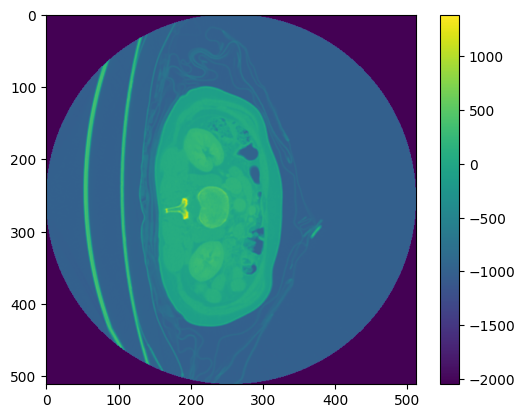

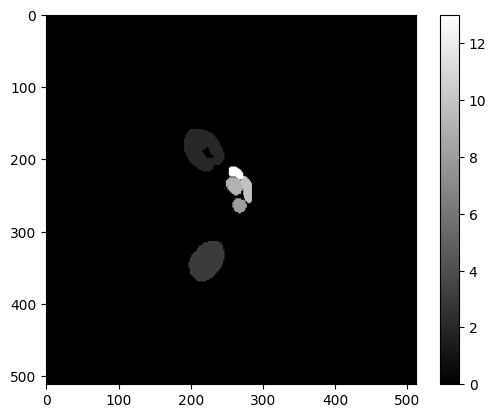

(1, 64, 64, 64)
(1, 64, 64, 64)


In [15]:
filea = "/home/anshul/Datasets_Analyze/Amos_Train/amos_0004.nii.gz"
fileb = "/home/anshul/Datasets_Analyze/Amos_Label/amos_0004.nii.gz"
image11 = nib.load(filea)
image12 = nib.load(fileb)
data11 = image11.get_fdata()
data12 = image12.get_fdata()
plt.imshow(data11[:,:,50], cmap = "viridis")
plt.colorbar(orientation="vertical")
plt.grid(False)
plt.show()
plt.imshow(data12[:,:,50], cmap = "gray")
plt.colorbar(orientation="vertical")
plt.grid(False)
plt.show()
re_data1 = skimage.transform.resize(data11, (64, 64, 64), order=0, preserve_range=2, anti_aliasing=False)
re_data2 = skimage.transform.resize(data12, (64, 64, 64), order=0, preserve_range=2, anti_aliasing=False)
re_data1 = np.reshape(re_data1, (1, 64, 64, 64))
re_data2 = np.reshape(re_data2, (1, 64, 64, 64))
print(re_data1.shape)
print(re_data2.shape)

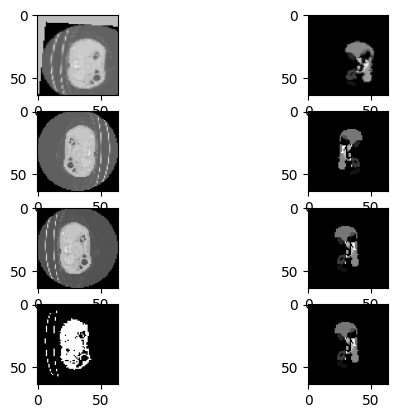

In [15]:
rotation_transform = RandomRotation3D()
flip_transform = RandomFlip3D(flip_probability=0.5)
brightness_transform = RandomBrightness()
noise_transform = RandomNoise()

image_rotate = rotation_transform([torch.from_numpy(re_data1.copy()).float(), torch.from_numpy(re_data2.copy()).float()])
image_flip = flip_transform([re_data1.copy(), re_data2.copy()])
image_bright = brightness_transform([re_data1.copy(), re_data2.copy()])
image_noise = noise_transform([re_data1.copy(), re_data2.copy()])

plt.subplot(4,2,1)
plt.imshow(image_rotate[0][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,2)
plt.imshow(image_rotate[1][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,3)
plt.imshow(image_flip[0][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,4)
plt.imshow(image_flip[1][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,5)
plt.imshow(image_bright[0][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,6)
plt.imshow(image_bright[1][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,7)
plt.imshow(image_noise[0][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.subplot(4,2,8)
plt.imshow(image_noise[1][0,:,:,50], cmap = "gray")
plt.grid(False)
plt.show()

#### Back to training procedure

In [13]:
composed_transform = transforms.Compose([
            RandomRotation3D(),
            RandomFlip3D(flip_probability=0.5),
            RandomBrightness(),
            RandomNoise(),
            ToTensor()
        ])

In [14]:
from torch.utils.data import Dataset
class numpy_dataset(Dataset):  # Inherit from Dataset class
    def __init__(self, data, target, transform=None):
        self.data = torch.from_numpy(data).float()
        self.target = torch.from_numpy(target).float()
        self.transform = transform # This is where you can add augmentations

    def __getitem__(self, index):
        x = self.data[index]
        y = self.target[index]

        if self.transform:
            x,y = self.transform([x,y])

        return x,y

    def __len__(self):
        return len(self.data)

In [15]:
from torch.utils.data import DataLoader
train_dataset = numpy_dataset(X_train, y_train, transform=composed_transform)
val_dataset = numpy_dataset(X_val, y_val, transform=composed_transform)
# train_dataset = numpy_dataset(X_train, y_train)
# val_dataset = numpy_dataset(X_val, y_val)
train_dataloader = DataLoader(train_dataset, batch_size=args.batch_size, shuffle=True, num_workers=0, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=args.batch_size, shuffle=False, num_workers=0, drop_last=True)

In [16]:
# This has 4 encoders and 4 decoders with a bottleneck layer
from collections import OrderedDict
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=2, init_features=64):
        super(UNet, self).__init__()
        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16, name="bottleneck")

        self.upconv4 = nn.ConvTranspose3d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose3d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose3d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose3d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.seg = nn.Conv3d( in_channels=features, out_channels=out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        seg = self.seg(dec1)
        return torch.sigmoid(seg)

    @staticmethod
    def _block(in_channels, features, name):
        return nn.Sequential(
            OrderedDict(
                [
                    (
                        name + "conv1",
                        nn.Conv3d(
                            in_channels=in_channels,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=True,
                        ),
                    ),
                    (name + "relu1", nn.ReLU(inplace=True)),
                    (name + "norm1", nn.BatchNorm3d(num_features=features)),

                    (
                        name + "conv2",
                        nn.Conv3d(
                            in_channels=features,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=True,
                        ),
                    ),
                    (name + "relu2", nn.ReLU(inplace=True)),
                    (name + "norm2", nn.BatchNorm3d(num_features=features)),
                ]
            )
        )

In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import nibabel as nib
import skimage.transform as resize
import seaborn as sns
import torch.nn as nn
import torch
import skimage
from torchvision import transforms

In [51]:
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as dist
import torchvision.transforms as transforms

class GIN_Transformation(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GIN_Transformation, self).__init__()
        self.conv1 = nn.Conv3d(in_channels=in_channels, out_channels=8, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.LeakyReLU(inplace=True)
        self.conv2 = nn.Conv3d(in_channels=8, out_channels=16, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.LeakyReLU(inplace=True)
        self.conv3 = nn.Conv3d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.LeakyReLU(inplace=True)
        self.conv4 = nn.Conv3d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.relu4 = nn.LeakyReLU(inplace=True)
        self.conv5 = nn.Conv3d(in_channels=64, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.relu5 = nn.LeakyReLU(inplace=True)
        self.dist = dist.Normal(0,1)  # Gaussian distribution for kernel sampling

    def forward(self, x):
        x1 = self.relu1(self.conv1(x.float()))
        x2 = self.relu2(self.conv2(x1))
        x3 = self.relu3(self.conv3(x2))
        x4 = self.relu4(self.conv4(x3))
        x5 = self.conv5(x4)
        

        alpha = torch.rand(1)
        print(alpha)
        augment = alpha * x5 + (1-alpha) * x
        
        normalized_augment = torch.norm(augment.view(augment.size(0), -1), dim=1, keepdim=True)
        normalized_origin = torch.norm(x.view(x.size(0), -1), dim=1, keepdim=True)
        augmented = augment * (normalized_origin / normalized_augment)

        return augmented

In [52]:
# Example usage
input_channels = 1  # Number of input channels (e.g., grayscale image)
output_channels = 1  # Number of output channels (e.g., number of classes)
input_size = (64, 64, 64)  # Size of input 3D image (height, width, depth)

# Create an instance of the shallow convolutional network
shallow_net = GIN_Transformation(input_channels, output_channels)

image = re_data1
image_input = torch.from_numpy(image)
print(image_input.shape)

# Forward pass through the shallow network
output = shallow_net(image_input).detach().cpu().numpy()

# Print the output shape
plt.imshow(image_input[0,:,:,50])
plt.show()
plt.imshow(output[0,:,:,50])
plt.show()

NameError: name 're_data1' is not defined

### GIN-IPA Development and Verification

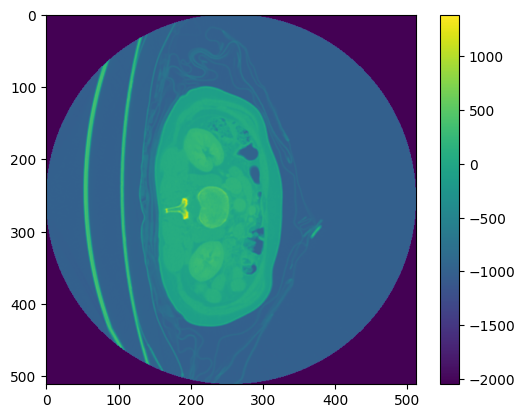

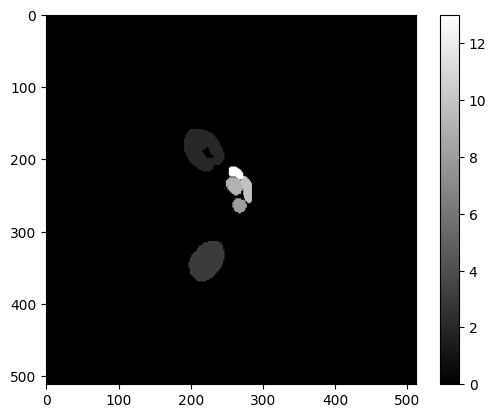

(1, 64, 64, 64)
(1, 64, 64, 64)


In [53]:
filea = "/home/anshul/Datasets_Analyze/Amos_Train/amos_0004.nii.gz"
fileb = "/home/anshul/Datasets_Analyze/Amos_Label/amos_0004.nii.gz"
image11 = nib.load(filea)
image12 = nib.load(fileb)
data11 = image11.get_fdata()
data12 = image12.get_fdata()
plt.imshow(data11[:,:,50], cmap = "viridis")
plt.colorbar(orientation="vertical")
plt.grid(False)
plt.show()
plt.imshow(data12[:,:,50], cmap = "gray")
plt.colorbar(orientation="vertical")
plt.grid(False)
plt.show()
re_data1 = skimage.transform.resize(data11, (64, 64, 64), order=0, preserve_range=2, anti_aliasing=False)
re_data2 = skimage.transform.resize(data12, (64, 64, 64), order=0, preserve_range=2, anti_aliasing=False)
re_data1 = np.reshape(re_data1, (1, 64, 64, 64))
re_data2 = np.reshape(re_data2, (1, 64, 64, 64))
print(re_data1.shape)
print(re_data2.shape)

### Global Intensity Non Linear Augmentation

In [13]:
import torch
from torch import nn 
from torch.nn import functional as F

In [14]:
class GradlessGCReplayNonlinBlock3D(nn.Module):
    def __init__(self, in_channel=1, out_channel=1, scale_pool = [1,3], use_act=True):
        """
        Convolution-leaky relu layer. Efficiently implemented by using Group Convolutions
        """
        super(GradlessGCReplayNonlinBlock3D, self).__init__()
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.scale_pool = scale_pool
        self.use_act = use_act

    def forward(self, x_in):
        # Choose a random size for the kernel
        idx_k = torch.randint(high=len(self.scale_pool), size=(1,))
        k = self.scale_pool[idx_k[0]]

        nb, nc, nx, ny, nz = x_in.shape

        ker = torch.randn([self.out_channel * nb, self.in_channel, k, k, k]).cuda()
        shift = torch.randn([self.out_channel * nb, 1, 1, 1]).cuda() * 1.0

        x_in = x_in.view(1, nb * nc, nx, ny, nz)
        x_conv = F.conv3d(x_in, ker, stride=1, padding=k//2, dilation=1, groups=nb)
        x_conv = x_conv + shift
        if self.use_act:
            x_conv = F.leaky_relu(x_conv)

        x_conv = x_conv.view(nb, self.out_channel, nx, ny, nz)

        return x_conv

In [15]:
class GINGroup_Conv3D(nn.Module):
    def __init__(self, out_channel=1, interim_channel=2, in_channel=1, scale_pool = [1,3], n_layer=4, out_norm = 'frob'):
        """
        Global Intensity Non-Linear Augmentation
        """
        super(GINGroup_Conv3D, self).__init__()
        self.scale_pool = scale_pool
        self.out_channel = out_channel
        self.in_channel = in_channel
        self.n_layer = n_layer
        self.out_norm = out_norm
        self.layers = []

        self.layers.append(
            GradlessGCReplayNonlinBlock3D(out_channel=interim_channel, in_channel=in_channel, scale_pool=scale_pool).cuda()
        )
        for i in range(n_layer-2):
            self.layers.append(
                GradlessGCReplayNonlinBlock3D(out_channel=interim_channel, in_channel=interim_channel, scale_pool=scale_pool).cuda()
            )
        self.layers.append(
            GradlessGCReplayNonlinBlock3D(out_channel=out_channel, in_channel=interim_channel, scale_pool=scale_pool, use_act=False).cuda()
        )

        self.layers = nn.ModuleList(self.layers)

    def forward(self, x_in):
        x_in = x_in.float()
        if isinstance(x_in, list):
            x_in = torch.cat(x_in, dim=0)

        nb, nc, nx, ny, nz = x_in.shape

        alphas = torch.rand(nb)[:, None, None, None, None] # nb, 1, 1, 1, 1
        alphas = alphas.repeat(1, nc, 1, 1, 1).cuda() # nb, nc, 1, 1

        x = self.layers[0](x_in)
        for blk in self.layers[1:]:
            x = blk(x)
        mixed = alphas * x + (1.0 - alphas) * x_in

        if self.out_norm == 'frob':
            _in_frob = torch.norm(x_in.view(nb, nc, -1), dim=(-1, -2), p='fro', keepdim=False)
            _in_frob = _in_frob[:, None, None, None, None].repeat(1, nc, 1, 1, 1)
            _self_frob = torch.norm(mixed.view(nb, self.out_channel, -1), dim=(-1,-2), p='fro', keepdim=False)
            _self_frob = _self_frob[:, None, None, None, None].repeat(1, self.out_channel, 1, 1, 1)
            mixed = mixed * (1.0 / (_self_frob + 1e-5)) * _in_frob

        return mixed

In [16]:

if __name__ == '__main__':
    # xin = torch.rand([5, 1, 64, 64, 32]).cuda()
    augmenter = GINGroup_Conv3D().cuda()
    # out = augmenter(xin).detach().cpu().numpy()
    # set_trace()
    # plt.imshow(xin[1,0,:,:,5].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(out[1,0,:,:,5])
    # plt.show()
    image = np.reshape(re_data1, (1,1,64,64,64))
    image_input = torch.from_numpy(image)
    image_input = image_input.cuda()
    print(image_input.shape)

    # Forward pass through the shallow network
    output = augmenter(image_input).detach().cpu().numpy()
    input = image_input.detach().cpu().numpy()
    # Print the output shape
    plt.imshow(input[0,0,:,:,50])
    plt.show()
    plt.imshow(output[0,0,:,:,50])
    plt.show()

NameError: name 're_data1' is not defined

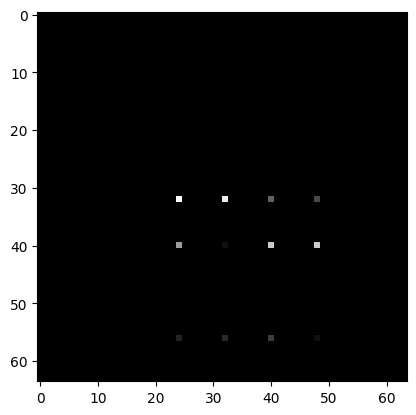

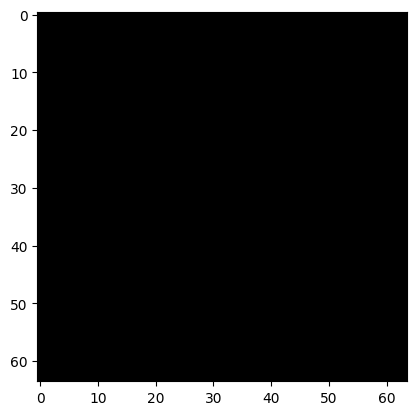

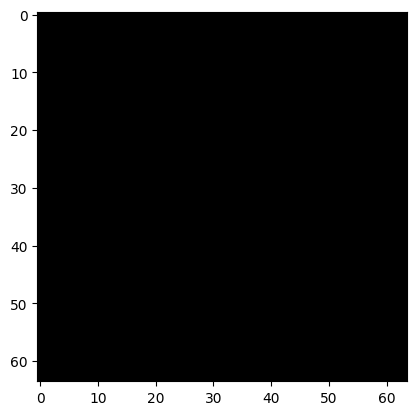

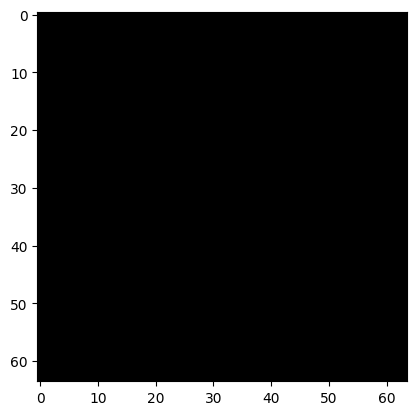

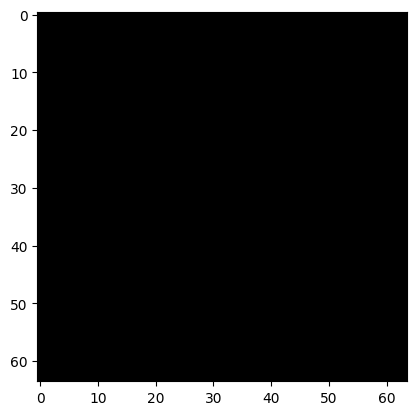

...

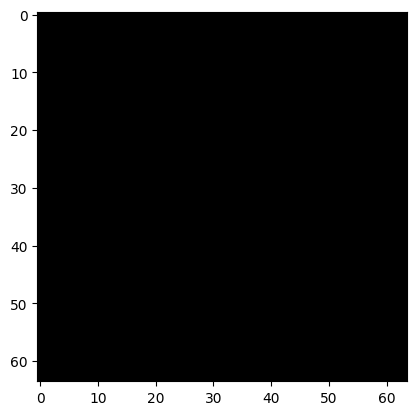

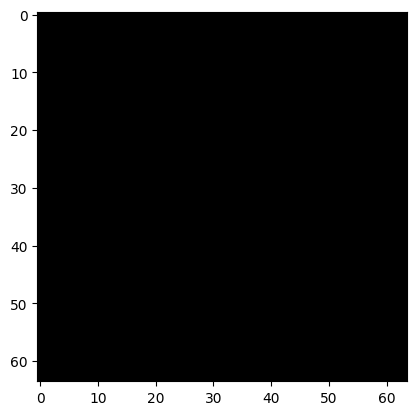

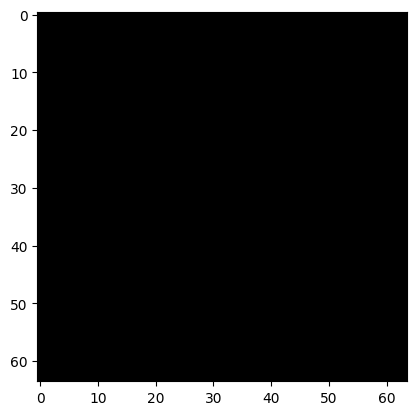

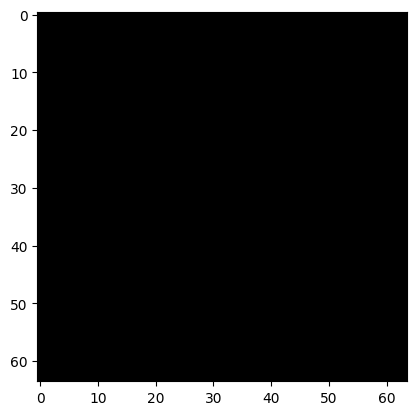

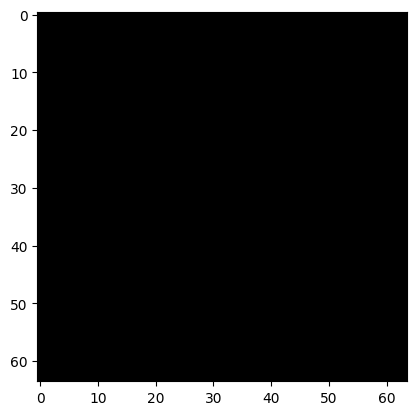

In [58]:
import numpy as np

# Define lattice size and spacing
image_length = 64
spacing = image_length // 8

# Generate random control point positions within the lattice
x = np.random.choice(np.arange(0, image_length, spacing), size=(4, 4, 4))
y = np.random.choice(np.arange(0, image_length, spacing), size=(4, 4, 4))
z = np.random.choice(np.arange(0, image_length, spacing), size=(4, 4, 4))

# Create a meshgrid from the control points
grid_x, grid_y, grid_z = np.meshgrid(x, y, z, indexing='ij')

# Generate random values for each control point in the range of 0 to 255
control_points = np.random.randint(0, 256, size=(4, 4, 4))

# Create the image from control points
image = np.zeros((image_length, image_length, image_length))
for i in range(len(x)):
    for j in range(len(y)):
        for k in range(len(z)):
            image[grid_x[i, j, k], grid_y[i, j, k], grid_z[i, j, k]] = control_points[i, j, k]

# Visualize the image
for j in range(64):
    plt.imshow(image[:, :, j], cmap='gray')
    plt.show()

### Interpolation Pseudo Augmentation

#### Rescale Intensity

In [7]:
import torch

In [8]:
def rescale_intensity(data,new_min=0,new_max=1,eps=1e-20):
    '''
    rescale :param data: N*1*H*W
    return  :data with intensity ranging from 0 to 1
    '''
    bs, c , h, w, d = data.shape
    data = data.view(bs*c, -1)
    # pytorch 1.3
    #old_max = torch.max(data, dim=1, keepdim=True).values
    #old_min = torch.min(data, dim=1, keepdim=True).values

    old_max = torch.max(data, dim=1, keepdim=True)[0]
    old_min = torch.min(data, dim=1, keepdim=True)[0]

    new_data = (data - old_min+eps) / (old_max - old_min + eps)*(new_max-new_min)+new_min
    new_data = new_data.view(bs, c, h, w, d)
    return new_data

#### L1, L2, Infinity Normalization

In [9]:
def unit_normalize(d, p_type='l2'):
    if p_type == 'l1':
        old_size = d.size()
        d_flatten = d.view(d.size(0), -1)
        norm = d_flatten.norm(p=1, dim=1, keepdim=True)
        d_normalized = d_flatten.div(norm.expand_as(d_flatten))
        return d_normalized.view(old_size)
    elif p_type == 'infinity':
        d_abs_max = torch.max(
            torch.abs(d.view(d.size(0), -1)), 1, keepdim=True)[0].view(
            d.size(0), 1, 1, 1, 1)
        d /= (1e-20 + d_abs_max)
    elif p_type == 'l2':
        d_abs_max = torch.max(
            torch.abs(d.view(d.size(0), -1)), 1, keepdim=True)[0].view(
            d.size(0), 1, 1, 1, 1)
        d /= (1e-20 + d_abs_max)
        d /= torch.sqrt(1e-6 + torch.sum(
            torch.pow(d, 2.0), tuple(range(1, len(d.size()))), keepdim=True))
    return d

#### B-Spline Matrix

In [10]:
#Create a 1d bspline kernel matrix
def bspline_kernel_1d(sigma, order=2, asTensor=False, dtype=torch.float32, device='cpu'):
    kernel_ones = torch.ones(1, 1, sigma)
    kernel = kernel_ones	
    padding = sigma - 1
    for i in range(1, order + 1):
        kernel = F.conv1d(kernel, kernel_ones, padding=padding)/sigma
    if asTensor:
        return kernel[0, 0, ...].to(dtype=dtype, device=device)
    else:
        return kernel[0, 0, ...].numpy()
#Create a 2d bspline kernel matrix
def bspline_kernel_2d(sigma=[1, 1], order=2, asTensor=False, dtype=torch.float32, device='cpu'):
    kernel_ones = torch.ones(1, 1, *sigma)
    kernel = kernel_ones
    padding = np.array(sigma) - 1
    for i in range(1, order + 1):
        kernel = F.conv2d(kernel, kernel_ones, padding=(padding).tolist())/(sigma[0]*sigma[1])
    if asTensor:
        return kernel[0, 0, ...].to(dtype=dtype, device=device)
    else:
        return kernel[0, 0, ...].numpy()
#Create a 3d bspline kernel matrix
def bspline_kernel_3d(sigma=[1, 1, 1], order=2, asTensor=False, dtype=torch.float32, device='cpu'):
    kernel_ones = torch.ones(1, 1, *sigma)
    kernel = kernel_ones
    padding = np.array(sigma)
    for i in range(1, order + 1):
        kernel = F.conv3d(kernel, kernel_ones, padding=(padding).tolist())/(sigma[0]*sigma[1]*sigma[2])
    if asTensor:
        return kernel[0, 0, ...].to(dtype=dtype, device=device)
    else:
        return kernel[0, 0, ...].numpy()

#### Initial Parameters

In [11]:
epsilon = 0.3
xi = 1e-6
control_point_spacing = [16, 16, 16]
data_size = [1, 64, 64, 64]
interpolation_order = 3
init_mode = 'gaussian'
space = 'log'

#### Main Function

torch.Size([1, 64, 64, 64])


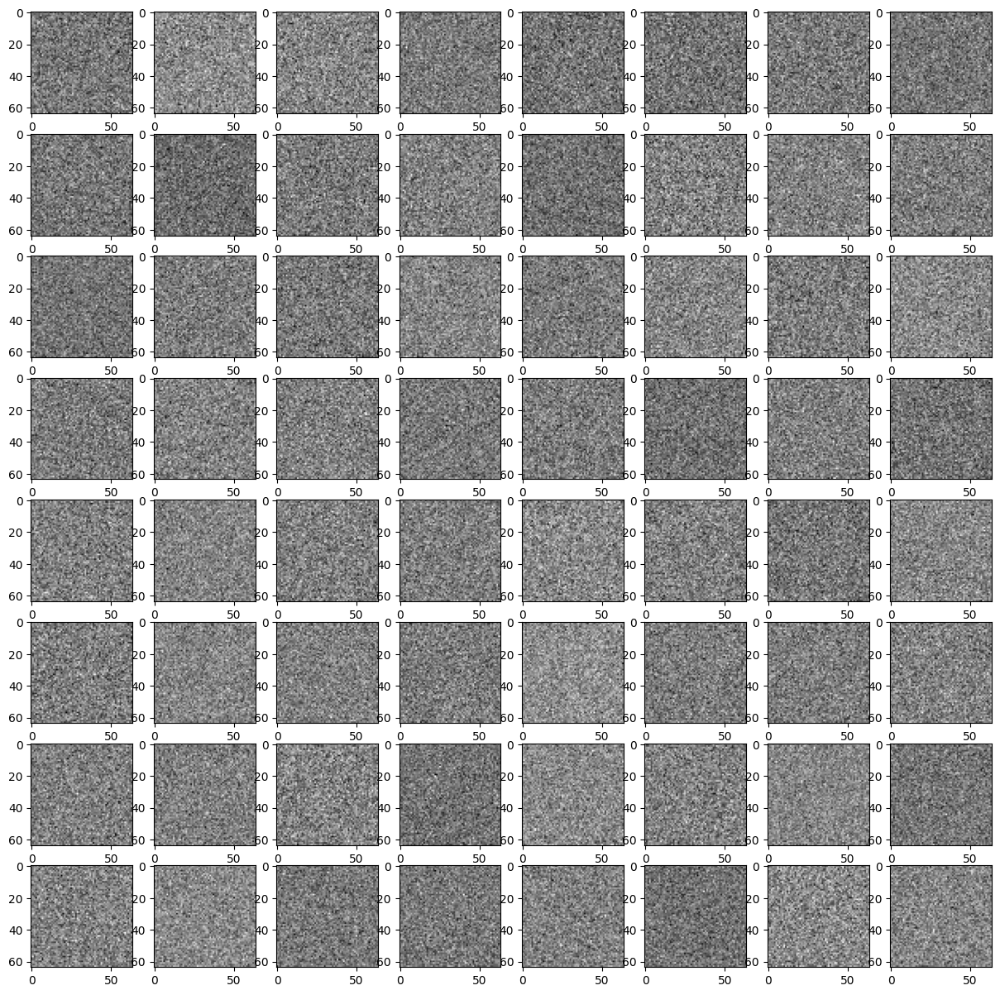

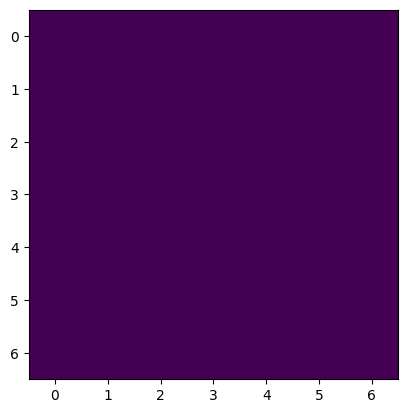

In [17]:
stride = np.array(control_point_spacing)
image_size = np.array([data_size[1], data_size[2], data_size[3]])
cp_grid = np.ceil(np.divide(image_size, stride)).astype(dtype=int)
inner_image_size = np.multiply(stride, cp_grid) - (stride-1)
cp_grid += 2
new_image_size = np.multiply(stride, cp_grid) - (stride-1)
image_size_diff = inner_image_size  - image_size
image_size_diff_floor = np.floor((np.abs(image_size_diff)/2))*np.sign(image_size_diff)
crop_start = image_size_diff_floor + np.remainder(image_size_diff, 2)*np.sign(image_size_diff)
crop_end = image_size_diff_floor
cp_grid = [ 1] + cp_grid.tolist()
cp_grid = [1, 64, 64, 64]
param = torch.ones(*cp_grid).normal_(mean=0,std=1)
# param = unit_normalize(param, p_type ='l2')
interp_kernel=bspline_kernel_3d(order=3)
print(param.shape)
plt.figure(figsize=(15,15))
for j in range(param.shape[-1]):
    plt.subplot(8,8,j+1)
    plt.imshow(param[0,:,:,j], cmap = "gray")
plt.show()
plt.imshow(interp_kernel[:,:,1])

(1, 128, 128, 128)


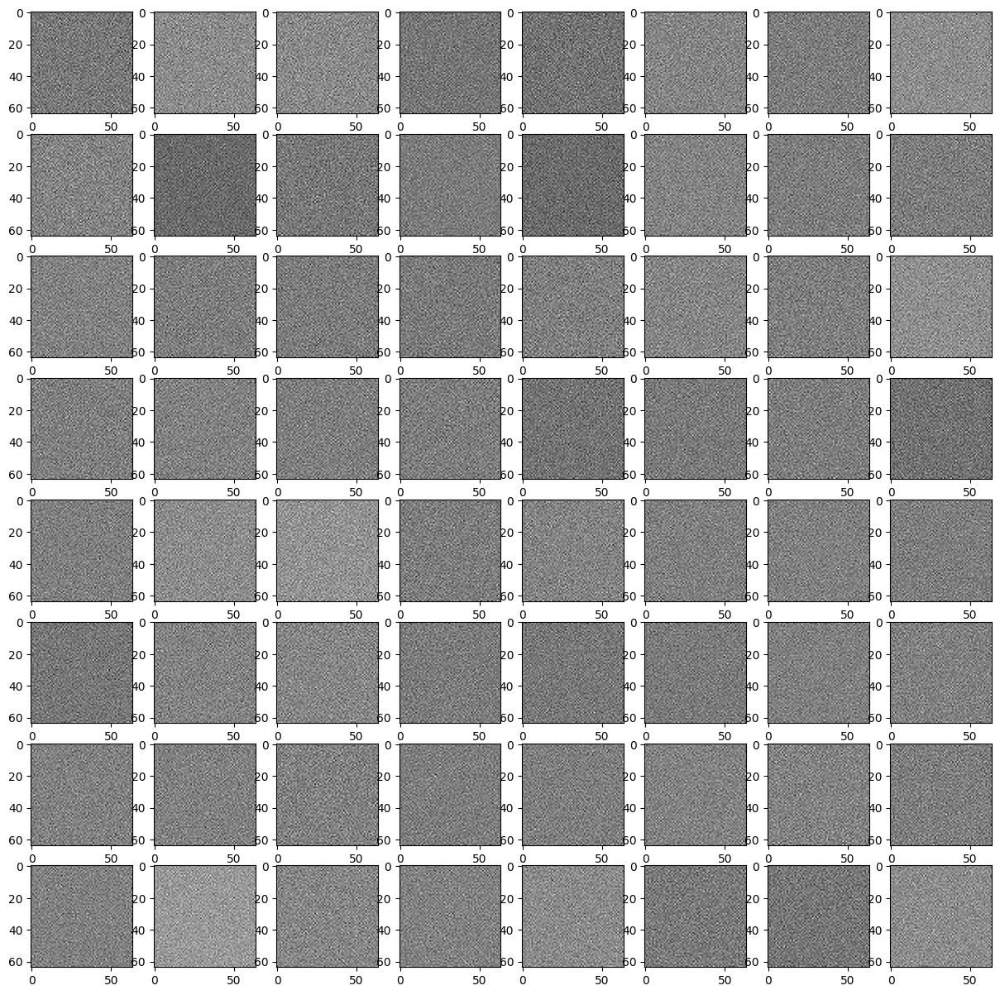

In [18]:
import numpy as np
import scipy.ndimage

# Define the zoom factor for interpolation
zoom_factor = (1,2, 2, 2)  # Increase the resolution by a factor of 2 in each dimension

# Perform cubic B-spline interpolation
interpolated_image = scipy.ndimage.spline_filter(param, order=3)

# Zoom the interpolated image
zoomed_image = scipy.ndimage.zoom(interpolated_image, zoom_factor)

# Print the shape of the zoomed image
print(zoomed_image.shape)

plt.figure(figsize=(15,15))
for j in range(64):
    plt.subplot(8,8,j+1)
    plt.imshow(interpolated_image[0,:,:,j], cmap = "gray")
plt.show()

In [176]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import Rbf

# Define the image dimensions
image_length = 128
control_point_spacing = image_length / 4

# Generate a lattice of control points
x = np.arange(0, image_length, control_point_spacing)
y = np.arange(0, image_length, control_point_spacing)

# Generate random values for the control points
control_points = np.random.rand(len(x), len(y))

# Create a meshgrid from the control points
X, Y = np.meshgrid(x, y)
Z = np.zeros((x.shape, ))

# Generate the pseudo-correlation map using cubic B-spline interpolation
interp_func = BSpline(np.arange(len(x)), np.arange(len(y)), control_points)
pseudo_correlation_map = interp_func(X, Y)

# Plot the pseudo-correlation map
plt.imshow(pseudo_correlation_map, cmap='gray')
plt.colorbar()
plt.show()


TypeError: only integer scalar arrays can be converted to a scalar index

In [179]:
data = np.array([[ 41. ,  57. ,  92. ],[ 39. ,  57.  , 92.4],[ 43. ,  57.  , 91.2], [ 23.,   47. , 119.6],
                 [ 27. ,  47. , 115.2], [ 25. ,  45. , 122. ], [ 25. ,  49. , 114. ],[ 29.,   49. , 109.6],
                 [ 29. ,  47. , 114.4], [ 27. ,  49. , 111.2], [ 23. ,  45. , 125.6], [ 31.,   49.,  106.8],
                 [ 25. ,  47. , 117.6], [ 39. ,  55. ,  95.6],[ 37.  , 53.  , 98.4], [ 35. ,  55. ,  96.8],
                 [ 33. ,  53. , 116.8], [ 23. ,  43. , 132.8], [ 25. ,  41. , 145.2],[ 25. ,  43.,  133.6],
                 [ 29. ,  51. , 106.4],[ 31.  , 53. , 121.2],[ 31., 51. , 104.8],[ 41.,   55.,   93.6],
                 [ 33. ,  51. , 103.6],[ 35.  , 53. ,  99.6],[ 37. ,  55. ,  96.4]])

x = data[:,0]
y = data[:,1]
z = data[:,2]

# sort data to avoid plotting problems
x, y, z = zip(*sorted(zip(x, y, z)))

x = np.array(x)
y = np.array(y)
z = np.array(z)

import scipy as sp
import scipy.interpolate
from mpl_toolkits.mplot3d import Axes3D

spline = sp.interpolate.Rbf(x,y,z,function='thin_plate',smooth=5, episilon=5)

x_grid = np.linspace(min(x),max(x), len(x))
y_grid = np.linspace(min(y),max(y), len(y))
B1, B2 = np.meshgrid(x_grid, y_grid, indexing='xy')

Z = spline(B1,B2)
fig = plt.figure(figsize=(10,6))
ax = Axes3D(fig)
ax.plot_wireframe(B1, B2, Z)
ax.plot_surface(B1, B2, Z,alpha=0.2)
ax.scatter3D(x,y,z, c='r')
plt.show()

<Figure size 1000x600 with 0 Axes>

(1, 1, 64, 64, 64)


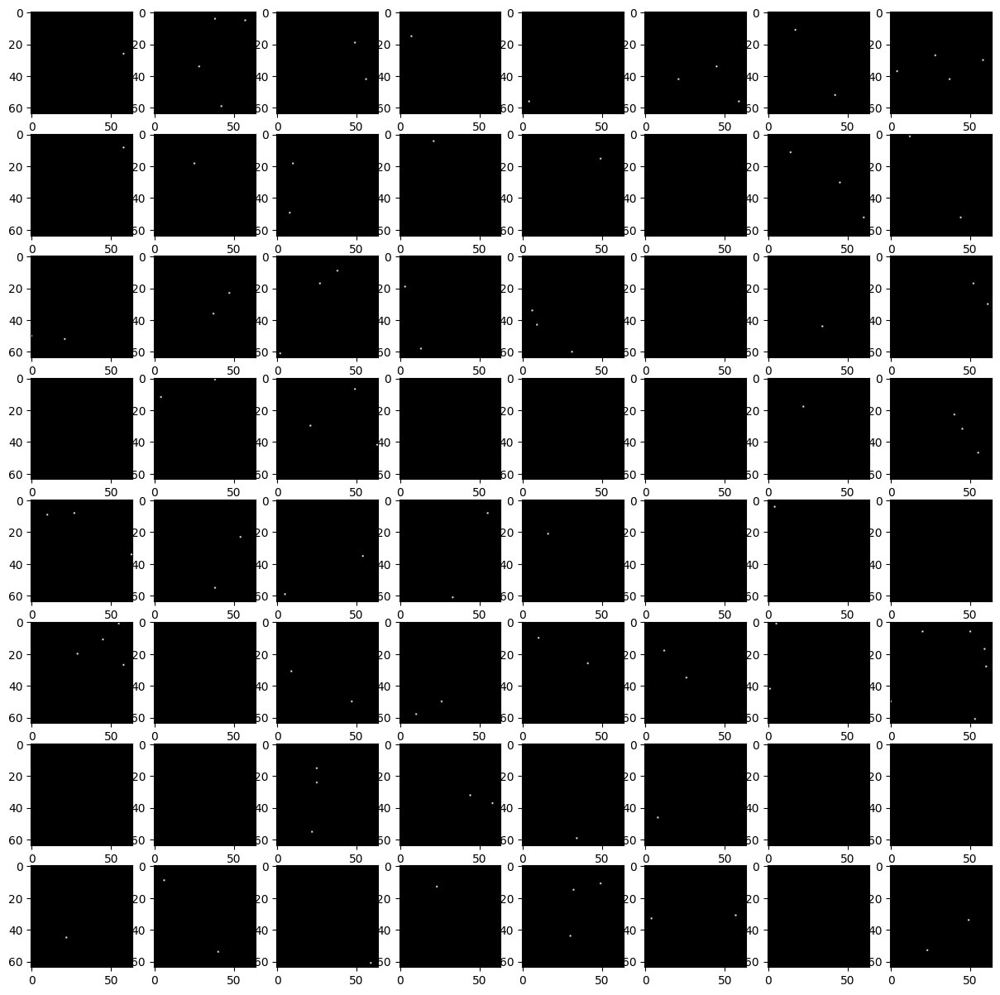

In [21]:
import numpy as np
from scipy.spatial.distance import cdist

batch_size = 1
channels = 1
height = 64
width = 64
depth = 64
num_control_points = 200  # Number of non-zero control points
min_distance = 8  # Minimum distance between control points

# Generate random positions for the control points
positions = np.random.uniform(low=0, high=1, size=(num_control_points, 3))
positions *= np.array([height, width, depth], dtype=np.float32)

# Calculate pairwise distances between control points
distances = cdist(positions, positions)

# Filter control points to ensure minimum distance
valid_indices = [0]  # Start with the first control point
for i in range(1, num_control_points):
    if np.min(distances[i, :i]) >= min_distance:
        valid_indices.append(i)

# Create an array of zeros for control points
control_points = np.zeros((batch_size, channels, height, width, depth))

# Set the selected control points to non-zero values
selected_positions = positions[valid_indices]
for position in selected_positions:
    x, y, z = position.astype(int)
    control_points[:, :, x, y, z] = 1.0

# Print the shape of the control points array
print(control_points.shape)

# Print the shape of the control points array
plt.figure(figsize=(15,15))
for j in range(64):
    plt.subplot(8,8,j+1)
    plt.imshow(control_points[0, 0,:,:,j], cmap = "gray")
plt.show()


In [20]:
import numpy as np
import scipy.ndimage

# Define the zoom factor for interpolation
zoom_factor = (1,2, 2, 2)  # Increase the resolution by a factor of 2 in each dimension

# Perform cubic B-spline interpolation
interpolated_image = scipy.ndimage.spline_filter(control_points[0,:,:,:], order=5)

# Zoom the interpolated image
zoomed_image = scipy.ndimage.zoom(interpolated_image, zoom_factor)

# Print the shape of the zoomed image
print(zoomed_image.shape)

plt.figure(figsize=(15,15))
for j in range(64):
    plt.subplot(8,8,j+1)
    plt.imshow(interpolated_image[0,:,:,j], cmap = "gray")
plt.show()


IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

In [19]:
import numpy as np

# Define the lattice size and number of control points
lattice_size = (64, 64, 64)
num_control_points = 100

# Generate random values for control points within the lattice size range
control_points = np.random.random((num_control_points, 3)) * np.array(lattice_size)

# Create a grid of coordinates for the image
grid = np.mgrid[0:lattice_size[0], 0:lattice_size[1], 0:lattice_size[2]]

# Compute the distances between each control point and the grid coordinates
distances = np.linalg.norm(grid[:, :, :, None] - control_points.T[None, None, None, :], axis=0)

# Perform interpolation using a suitable interpolation function (e.g., cubic interpolation)
pseudo_correlation_maps = your_interpolation_function(distances)


ValueError: operands could not be broadcast together with shapes (3,64,64,1,64) (1,1,1,3,100) 